# Solution for Prieskumna analyza dat 37 - Mark Bartalos

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

# Files

In [2]:
products = pd.read_csv("data/product.csv", sep='\t')
sessions = pd.read_csv("data/session.csv", sep='\t')
users = pd.read_csv("data/user.csv", sep='\t')


### Merging the datafiles

In [105]:
combined = sessions.join(products.set_index('product_ean'),on='product_ean', how='left')

In [101]:
combined.head()

,pct_wild_mouse,screen_height,pct_input,pct_scrandom,pct_scroll_move,pct_click_product_info,wild_mouse_duration,session_start,total_load_time,pct_click,...,scroll_move_total_rel_distance,page_activity_duration,mouse_move_total_rel_distance,browser_name,pct_rage_click,session_duration,pct_mouse_click,code,location,store_name
0,33.93175,600,2.02433,47.57172,77.67966,50.06169,16.15405,2022-04-16 18:13:19,3.66109,15.21849,...,13.31028,15.50704,16.78128,safari,73.88232,93.50794,NaN,NaN,NaN,NaN
1,35.01962,768,2.73613,44.98978,40.38256,53.78582,16.44725,2022-09-07 09:34:07,3.06183,17.79744,...,18.33657,15.76245,16.67535,firefox,36.27018,83.05534,15.63971,NaN,NaN,NaN
2,61.41151,800,2.30551,56.16179,29.32719,61.74431,16.28032,2022-08-01 19:22:50,4.30491,16.56530,...,7.24767,15.94806,17.84916,opera,44.07316,212.16973,13.54653,NaN,NaN,NaN
3,44.86510,600,4.67376,51.02882,57.35852,44.10727,16.97307,2020-03-28 06:00:21,2.66177,14.10738,...,9.27093,17.21545,15.85436,edge,61.91555,62.13615,14.83673,NaN,NaN,NaN
4,61.66559,800,6.29241,33.35663,50.05876,36.03935,17.26692,2023-02-12 18:25:13,3.67287,19.04736,...,19.71573,17.01892,16.65385,chrome,21.36066,157.60814,15.17088,NaN,NaN,NaN


In [102]:
combined.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11094 entries, 0 to 11093
Data columns (total 28 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   pct_wild_mouse                  11083 non-null  float64
 1   screen_height                   11094 non-null  object 
 2   pct_input                       11083 non-null  float64
 3   pct_scrandom                    11083 non-null  float64
 4   pct_scroll_move                 11083 non-null  float64
 5   pct_click_product_info          11083 non-null  float64
 6   wild_mouse_duration             11083 non-null  float64
 7   session_start                   11094 non-null  object 
 8   total_load_time                 11094 non-null  float64
 9   pct_click                       11083 non-null  float64
 10  screen_width                    11094 non-null  object 
 11  pct_doubleclick                 11081 non-null  float64
 12  product_ean                     

In [103]:
combined.describe()

,pct_wild_mouse,pct_input,pct_scrandom,pct_scroll_move,pct_click_product_info,wild_mouse_duration,total_load_time,pct_click,pct_doubleclick,product_ean,...,user_id,session_id,pct_scroll_move_duration,ack,scroll_move_total_rel_distance,page_activity_duration,mouse_move_total_rel_distance,pct_rage_click,session_duration,pct_mouse_click
count,11083.000000,11083.000000,11083.000000,11083.000000,11083.000000,11083.000000,11094.000000,11083.000000,11081.000000,1.109400e+04,...,11094.000000,1.109400e+04,11082.000000,11094.000000,11083.000000,11082.000000,11083.000000,11083.000000,11094.000000,11083.000000
mean,52.648139,3.803649,48.199461,46.135119,49.435683,16.264905,4.027537,17.188308,14.563180,5.032917e+12,...,1244.584009,7.464349e+05,16.275561,0.547503,14.383866,16.259771,17.185601,53.189386,149.918809,14.579468
std,11.230331,5.014442,12.435101,12.872627,12.421234,1.008102,2.819824,1.885194,1.515884,2.899916e+12,...,716.904975,4.320103e+05,2.170240,0.497761,3.888057,0.992421,1.981048,12.333659,59.929973,1.541677
min,0.000000,0.000000,0.000000,0.000000,0.000000,12.680180,0.009100,9.637950,8.867820,4.696783e+08,...,0.000000,1.121000e+03,9.984270,0.000000,0.000000,12.253120,9.462320,0.000000,-80.853850,8.065100
25%,45.140475,1.107265,39.905510,37.686685,41.221105,15.575645,1.959313,15.996600,13.562350,2.542907e+12,...,619.000000,3.754432e+05,14.531152,0.000000,11.702235,15.591965,15.914905,44.753915,110.215690,13.527780
50%,52.931850,2.294230,48.133300,46.238390,49.380050,16.275950,3.385275,17.526550,14.564720,5.036333e+12,...,1247.000000,7.410480e+05,16.198430,1.000000,14.398810,16.263575,17.442770,53.171720,149.994645,14.587300
75%,60.268910,4.561370,56.574765,54.804880,57.769000,16.950055,5.437817,18.485405,15.569400,7.541976e+12,...,1853.000000,1.118559e+06,17.988220,1.000000,17.110365,16.915835,18.615355,61.702065,189.810583,15.621170
max,100.000000,100.000000,100.000000,100.000000,100.000000,20.023140,23.218750,23.227590,20.025180,9.999067e+12,...,2499.000000,1.499883e+06,23.235320,1.000000,27.442960,19.883820,23.501450,100.000000,401.202740,21.278320


In [104]:
combined.dtypes

pct_wild_mouse                    float64
screen_height                      object
pct_input                         float64
pct_scrandom                      float64
pct_scroll_move                   float64
pct_click_product_info            float64
wild_mouse_duration               float64
session_start                      object
total_load_time                   float64
pct_click                         float64
screen_width                       object
pct_doubleclick                   float64
product_ean                         int64
pct_mouse_move                    float64
user_id                             int64
session_id                          int64
pct_scroll_move_duration          float64
ack                               float64
scroll_move_total_rel_distance    float64
page_activity_duration            float64
mouse_move_total_rel_distance     float64
browser_name                       object
pct_rage_click                    float64
session_duration                  

## Statistics for products

In [3]:
products.head()

,code,location,store_name,product_ean
0,HR,Europe/Zagreb,Split,3618641987900
1,CN,Asia/Shanghai,Heyuan,890698872559
2,NL,Europe/Amsterdam,Barneveld,2447491624236
3,MX,America/Mexico_City,Tuxtla,2920947188549
4,US,America/New_York,Sun City Center,4869841703558


In [4]:
products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14962 entries, 0 to 14961
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   code         14948 non-null  object
 1   location     14962 non-null  object
 2   store_name   14962 non-null  object
 3   product_ean  14962 non-null  int64 
dtypes: int64(1), object(3)
memory usage: 467.7+ KB


In [5]:
products.dtypes

code           object
location       object
store_name     object
product_ean     int64
dtype: object

In [6]:
products.describe()

,product_ean
count,1.496200e+04
mean,5.056087e+12
std,2.886705e+12
min,4.120895e+08
25%,2.574982e+12
50%,5.058009e+12
75%,7.576357e+12
max,9.999214e+12


In [7]:
products.count()

code           14948
location       14962
store_name     14962
product_ean    14962
dtype: int64

## Statistics for session

In [8]:
sessions.head()

,pct_wild_mouse,screen_height,pct_input,pct_scrandom,pct_scroll_move,pct_click_product_info,wild_mouse_duration,session_start,total_load_time,pct_click,...,session_id,pct_scroll_move_duration,ack,scroll_move_total_rel_distance,page_activity_duration,mouse_move_total_rel_distance,browser_name,pct_rage_click,session_duration,pct_mouse_click
0,33.93175,600,2.02433,47.57172,77.67966,50.06169,16.15405,2022-04-16 18:13:19,3.66109,15.21849,...,341891,17.64845,0.0,13.31028,15.50704,16.78128,safari,73.88232,93.50794,NaN
1,35.01962,768,2.73613,44.98978,40.38256,53.78582,16.44725,2022-09-07 09:34:07,3.06183,17.79744,...,1302699,16.90542,1.0,18.33657,15.76245,16.67535,firefox,36.27018,83.05534,15.63971
2,61.41151,800,2.30551,56.16179,29.32719,61.74431,16.28032,2022-08-01 19:22:50,4.30491,16.56530,...,1346090,20.42301,1.0,7.24767,15.94806,17.84916,opera,44.07316,212.16973,13.54653
3,44.86510,600,4.67376,51.02882,57.35852,44.10727,16.97307,2020-03-28 06:00:21,2.66177,14.10738,...,320000,19.13251,0.0,9.27093,17.21545,15.85436,edge,61.91555,62.13615,14.83673
4,61.66559,800,6.29241,33.35663,50.05876,36.03935,17.26692,2023-02-12 18:25:13,3.67287,19.04736,...,291366,13.65667,0.0,19.71573,17.01892,16.65385,chrome,21.36066,157.60814,15.17088


In [9]:
sessions.dtypes

pct_wild_mouse                    float64
screen_height                      object
pct_input                         float64
pct_scrandom                      float64
pct_scroll_move                   float64
pct_click_product_info            float64
wild_mouse_duration               float64
session_start                      object
total_load_time                   float64
pct_click                         float64
screen_width                       object
pct_doubleclick                   float64
product_ean                         int64
pct_mouse_move                    float64
user_id                             int64
session_id                          int64
pct_scroll_move_duration          float64
ack                               float64
scroll_move_total_rel_distance    float64
page_activity_duration            float64
mouse_move_total_rel_distance     float64
browser_name                       object
pct_rage_click                    float64
session_duration                  

In [10]:
sessions.describe()

,pct_wild_mouse,pct_input,pct_scrandom,pct_scroll_move,pct_click_product_info,wild_mouse_duration,total_load_time,pct_click,pct_doubleclick,product_ean,...,user_id,session_id,pct_scroll_move_duration,ack,scroll_move_total_rel_distance,page_activity_duration,mouse_move_total_rel_distance,pct_rage_click,session_duration,pct_mouse_click
count,11083.000000,11083.000000,11083.000000,11083.000000,11083.000000,11083.000000,11094.000000,11083.000000,11081.000000,1.109400e+04,...,11094.000000,1.109400e+04,11082.000000,11094.000000,11083.000000,11082.000000,11083.000000,11083.000000,11094.000000,11083.000000
mean,52.648139,3.803649,48.199461,46.135119,49.435683,16.264905,4.027537,17.188308,14.563180,5.032917e+12,...,1244.584009,7.464349e+05,16.275561,0.547503,14.383866,16.259771,17.185601,53.189386,149.918809,14.579468
std,11.230331,5.014442,12.435101,12.872627,12.421234,1.008102,2.819824,1.885194,1.515884,2.899916e+12,...,716.904975,4.320103e+05,2.170240,0.497761,3.888057,0.992421,1.981048,12.333659,59.929973,1.541677
min,0.000000,0.000000,0.000000,0.000000,0.000000,12.680180,0.009100,9.637950,8.867820,4.696783e+08,...,0.000000,1.121000e+03,9.984270,0.000000,0.000000,12.253120,9.462320,0.000000,-80.853850,8.065100
25%,45.140475,1.107265,39.905510,37.686685,41.221105,15.575645,1.959313,15.996600,13.562350,2.542907e+12,...,619.000000,3.754432e+05,14.531152,0.000000,11.702235,15.591965,15.914905,44.753915,110.215690,13.527780
50%,52.931850,2.294230,48.133300,46.238390,49.380050,16.275950,3.385275,17.526550,14.564720,5.036333e+12,...,1247.000000,7.410480e+05,16.198430,1.000000,14.398810,16.263575,17.442770,53.171720,149.994645,14.587300
75%,60.268910,4.561370,56.574765,54.804880,57.769000,16.950055,5.437817,18.485405,15.569400,7.541976e+12,...,1853.000000,1.118559e+06,17.988220,1.000000,17.110365,16.915835,18.615355,61.702065,189.810583,15.621170
max,100.000000,100.000000,100.000000,100.000000,100.000000,20.023140,23.218750,23.227590,20.025180,9.999067e+12,...,2499.000000,1.499883e+06,23.235320,1.000000,27.442960,19.883820,23.501450,100.000000,401.202740,21.278320


In [11]:
sessions.count()

pct_wild_mouse                    11083
screen_height                     11094
pct_input                         11083
pct_scrandom                      11083
pct_scroll_move                   11083
pct_click_product_info            11083
wild_mouse_duration               11083
session_start                     11094
total_load_time                   11094
pct_click                         11083
screen_width                      11094
pct_doubleclick                   11081
product_ean                       11094
pct_mouse_move                    11083
user_id                           11094
session_id                        11094
pct_scroll_move_duration          11082
ack                               11094
scroll_move_total_rel_distance    11083
page_activity_duration            11082
mouse_move_total_rel_distance     11083
browser_name                      11094
pct_rage_click                    11083
session_duration                  11094
pct_mouse_click                   11083


In [12]:
numeric_cols = sessions.select_dtypes(include=[np.number]).columns
session_numeric = sessions[numeric_cols]
session_numeric.corr()


,pct_wild_mouse,pct_input,pct_scrandom,pct_scroll_move,pct_click_product_info,wild_mouse_duration,total_load_time,pct_click,pct_doubleclick,product_ean,...,user_id,session_id,pct_scroll_move_duration,ack,scroll_move_total_rel_distance,page_activity_duration,mouse_move_total_rel_distance,pct_rage_click,session_duration,pct_mouse_click
pct_wild_mouse,1.000000,-0.010566,-0.005930,-0.013117,0.002614,-0.019128,-0.000499,-0.012769,0.006908,-0.008520,...,0.001262,-0.016265,0.002566,-0.010798,-0.012804,0.004480,-0.003296,-0.007885,-0.011341,-0.011969
pct_input,-0.010566,1.000000,-0.001720,-0.001320,0.007180,0.771646,0.002169,0.000415,0.000654,0.010486,...,0.000987,0.006035,-0.002715,-0.002890,-0.001231,0.010778,0.002932,-0.015208,0.005173,-0.008617
pct_scrandom,-0.005930,-0.001720,1.000000,0.012526,-0.015380,-0.005581,-0.002988,0.005094,-0.007074,0.000138,...,0.008533,-0.010799,-0.003939,0.004934,0.009358,0.005594,0.003332,0.000926,0.005704,0.007465
pct_scroll_move,-0.013117,-0.001320,0.012526,1.000000,-0.009027,-0.002261,-0.010750,0.007473,0.000345,-0.015696,...,0.010153,0.006359,-0.001515,0.013455,0.005756,0.010123,0.004221,0.000860,0.002153,0.001846
pct_click_product_info,0.002614,0.007180,-0.015380,-0.009027,1.000000,0.000994,-0.006601,0.006051,0.001221,0.007085,...,-0.004956,-0.011062,-0.007079,0.007639,0.005911,-0.003901,0.009448,0.008057,0.001434,-0.000955
wild_mouse_duration,-0.019128,0.771646,-0.005581,-0.002261,0.000994,1.000000,-0.003356,0.000801,-0.004138,0.010918,...,0.008115,0.018343,0.000907,0.000368,-0.008606,0.009621,0.000186,-0.022848,0.014425,-0.017444
total_load_time,-0.000499,0.002169,-0.002988,-0.010750,-0.006601,-0.003356,1.000000,-0.000606,-0.008807,-0.020838,...,-0.001998,-0.006990,0.006407,-0.008346,-0.010926,0.000378,-0.001726,0.004100,-0.024555,-0.006844
pct_click,-0.012769,0.000415,0.005094,0.007473,0.006051,0.000801,-0.000606,1.000000,0.009588,0.008126,...,0.010437,-0.009922,-0.455205,0.413427,0.567338,0.009893,0.569188,0.009084,0.007981,0.010446
pct_doubleclick,0.006908,0.000654,-0.007074,0.000345,0.001221,-0.004138,-0.008807,0.009588,1.000000,-0.000345,...,-0.005531,0.010364,-0.054097,0.008799,0.419979,-0.015005,-0.096047,-0.006256,-0.006049,-0.091696
product_ean,-0.008520,0.010486,0.000138,-0.015696,0.007085,0.010918,-0.020838,0.008126,-0.000345,1.000000,...,-0.002934,0.005113,-0.014288,-0.001940,0.014152,-0.011769,0.010686,0.023361,-0.000910,0.014255


/Users/markbartalos/.virtualenvs/iau/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/markbartalos/.virtualenvs/iau/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/markbartalos/.virtualenvs/iau/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/markbartalos/.virtualenvs/iau/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed i

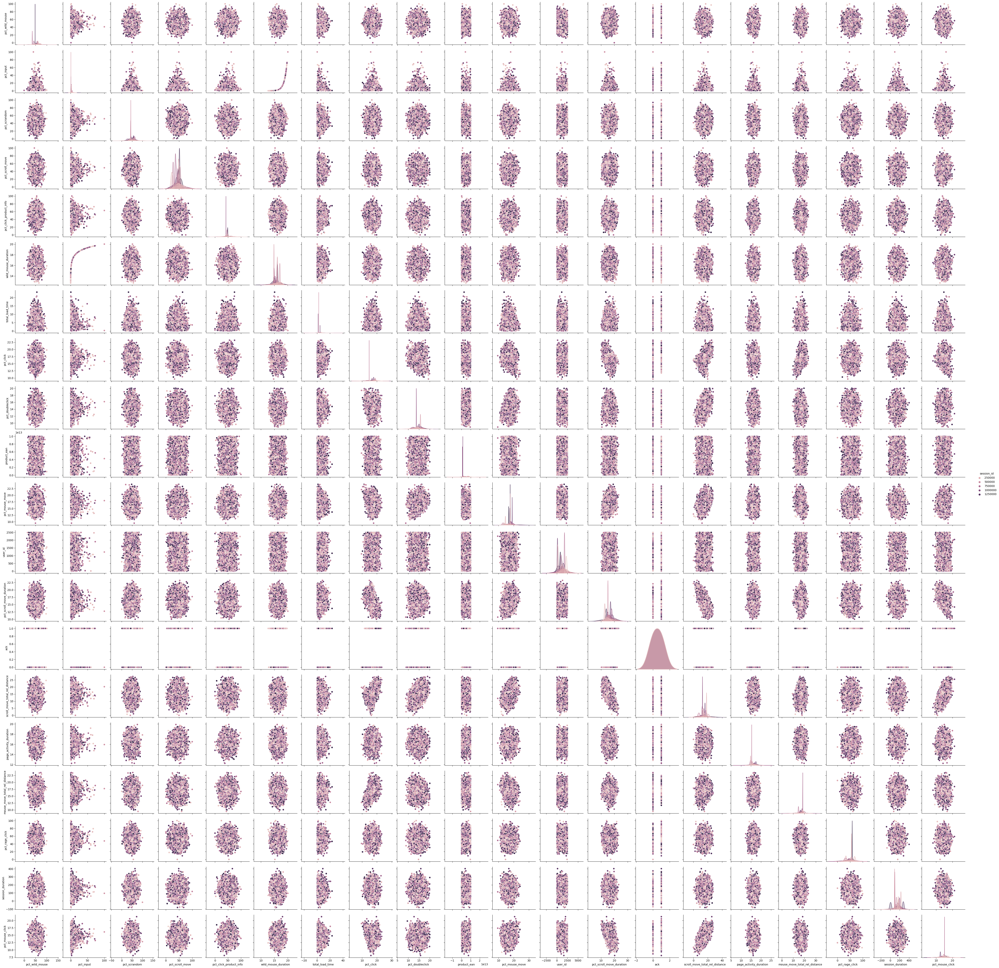

In [77]:
sns.pairplot(sessions, hue="session_id")

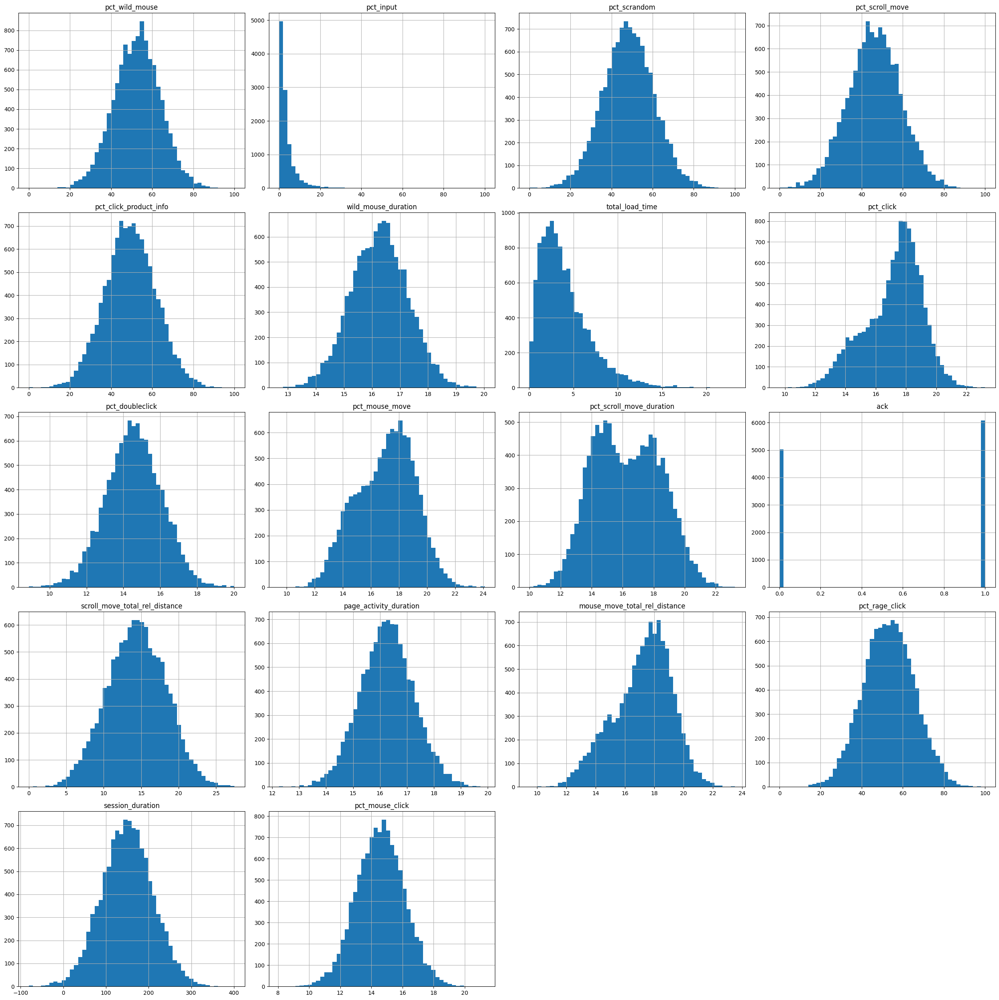

In [80]:
sessions.hist(column=sessions.drop(columns=['user_id','session_id','product_ean']).columns,figsize=(25,25), bins=50)
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Correlation Heatmap')

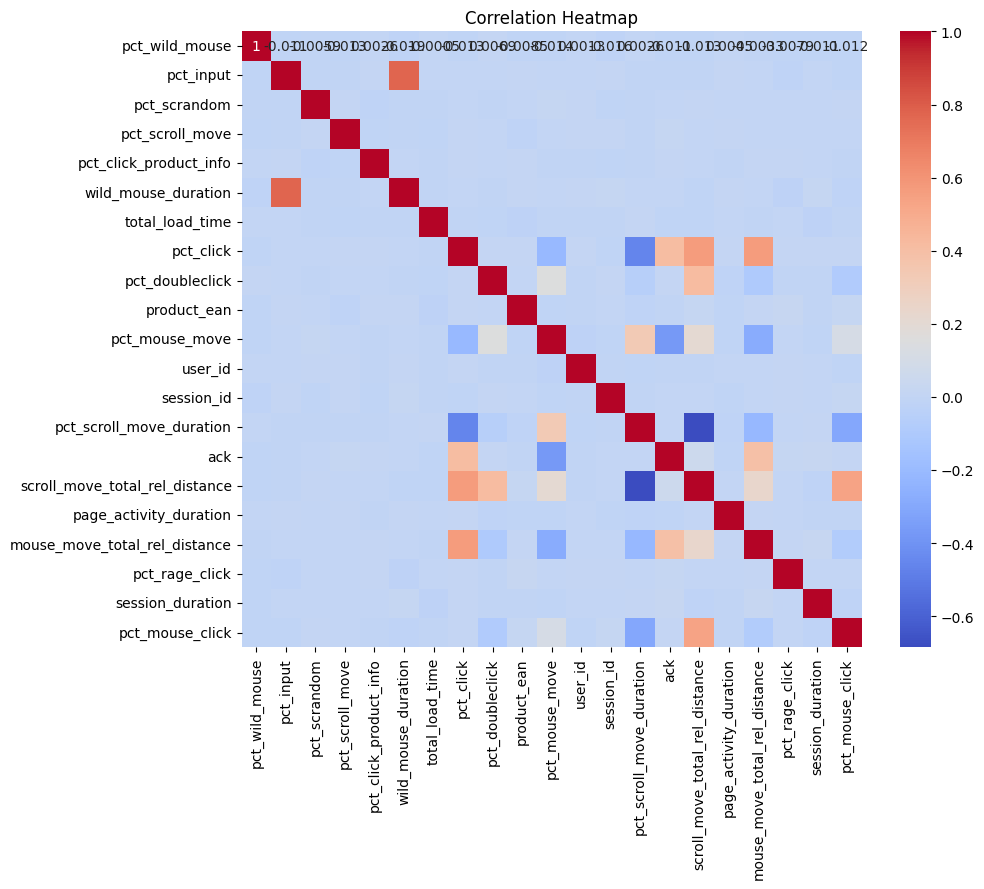

In [13]:
plt.figure(figsize=(10,8))
sns.heatmap(session_numeric.corr(), annot=True, cmap="coolwarm")
plt.title('Correlation Heatmap')

From the heatmap we can see that there are some correlations between the columns `pct_click` and `scroll_move_total_rel_distance`, also between `pct_click` and `mouse_move_total_rel_distance`, between `scroll_move_total_rel_distance` and `scroll_move_total_rel_distance`, finally there is srong correlation between `wild_mouse_duration` and `scroll_move_total_rel_distance`. For predicting if the user will click on a product these columns could be used.
There are also the column pairs such as `ack` and `pct_click`, `scroll_move_total_rel_distance` and `pct_doubleclick`, `pct_mouse_move` and `pct_scroll_move_duration` which also show some correlation between each other.

We can observe negative correlation between the columns `scroll_move_total_rel_distance` and `pct_scroll_move_duration` columns.

array([[<Axes: title={'center': 'pct_click'}>,
        <Axes: title={'center': 'wild_mouse_duration'}>,
        <Axes: title={'center': 'scroll_move_total_rel_distance'}>],
       [<Axes: title={'center': 'mouse_move_total_rel_distance'}>,
        <Axes: title={'center': 'pct_scroll_move_duration'}>,
        <Axes: title={'center': 'ack'}>],
       [<Axes: title={'center': 'pct_mouse_move'}>,
        <Axes: title={'center': 'pct_doubleclick'}>,
        <Axes: title={'center': 'pct_scroll_move_duration'}>],
       [<Axes: title={'center': 'pct_input'}>, <Axes: >, <Axes: >]],
      dtype=object)

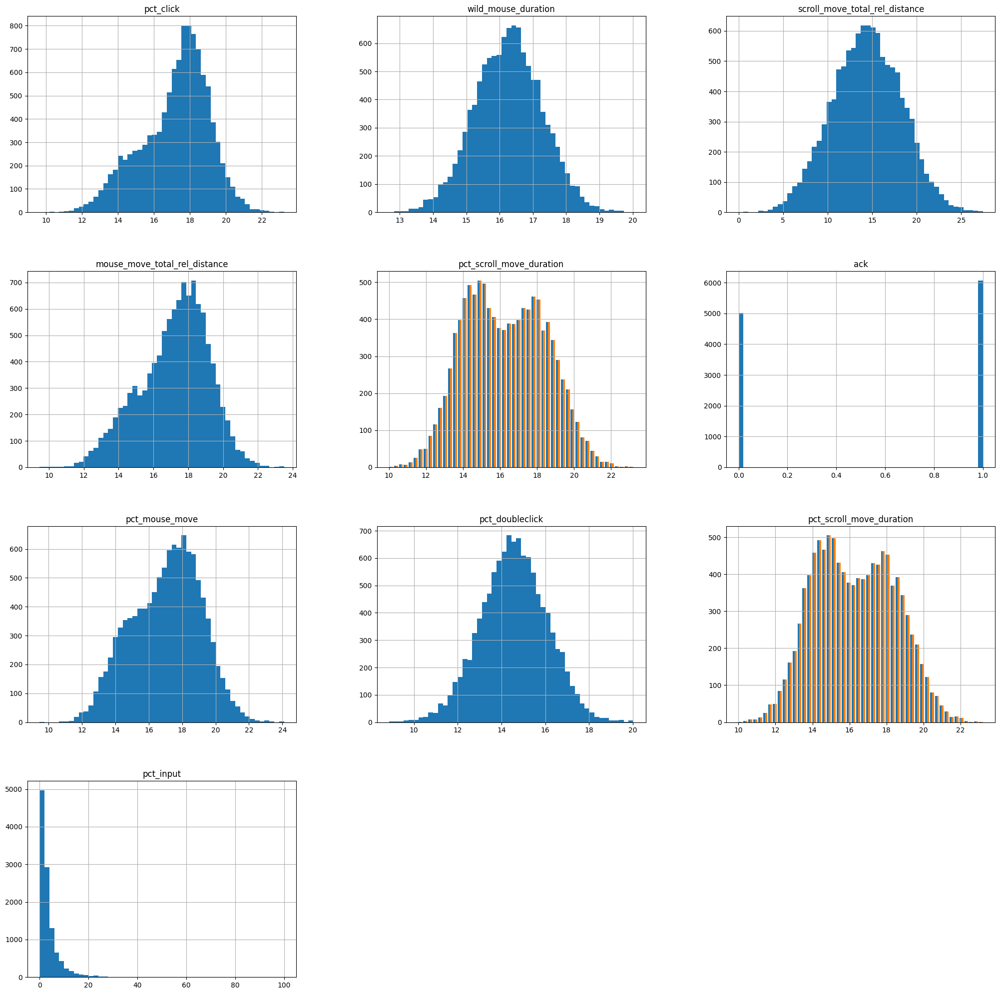

In [110]:
important_columns = ['pct_click','wild_mouse_duration',
'scroll_move_total_rel_distance','mouse_move_total_rel_distance',
'pct_scroll_move_duration','ack','pct_mouse_move', 'pct_doubleclick',
'pct_scroll_move_duration','pct_input']
sessions.hist(column=important_columns,figsize=(25,25), bins=50)

## Correlation between the important columns for prediction

<Axes: >

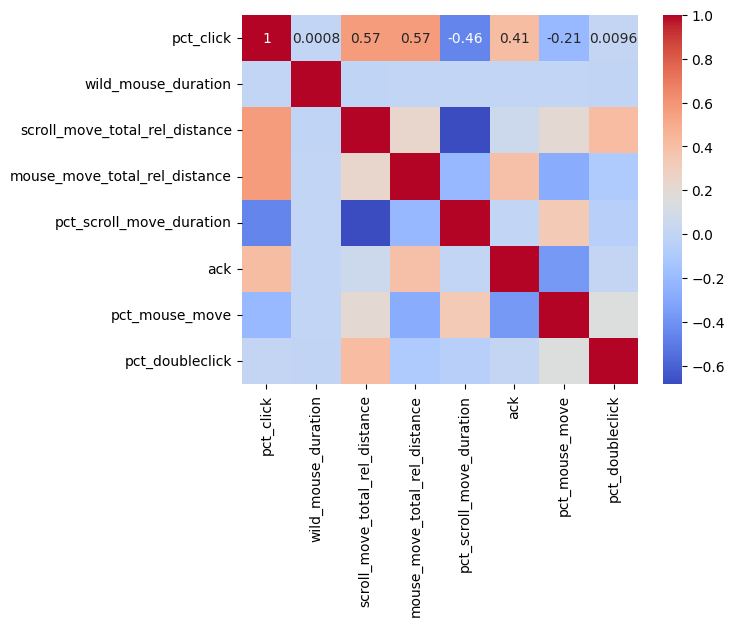

In [108]:

sns.heatmap(sessions[important_columns].corr(), annot=True, cmap='coolwarm')

/Users/markbartalos/.virtualenvs/iau/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/markbartalos/.virtualenvs/iau/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/markbartalos/.virtualenvs/iau/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/markbartalos/.virtualenvs/iau/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed i

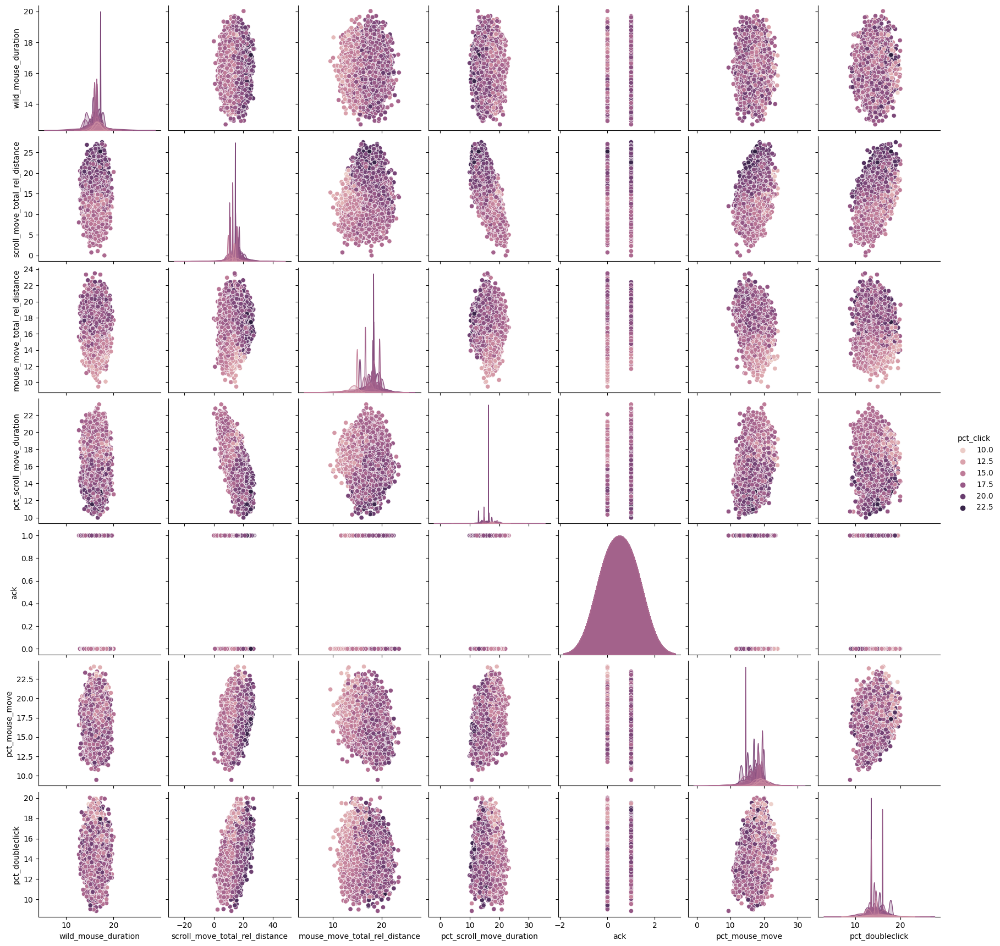

In [109]:
sns.pairplot(sessions[important_columns].dropna(), hue="pct_click")

# Statistics for users

In [15]:
users.head()

,username,residence,current_location,name,mail,job,sex,race,address,birthdate,user_id
0,gabrieladas-neves,NaN,"(Decimal('-37.802134'), Decimal('79.453092'))",Sabrina da Luz,xda-cunha@yahoo.com.br,Engenheiro aeronáutico,NaN,NaN,"Condomínio de Silva, 16\nNovo Ouro Preto\n6891...",NaN,640
1,ferreirajulia,NaN,"(Decimal('4.633756'), Decimal('102.063245'))",Maria Vitória Mendes,catarinada-conceicao@gmail.com,Mãe social,F,black,"Campo Eloah Ribeiro, 66\nEstrela Do Oriente\n2...",1946-06-27,1222
2,isadora80,NaN,"(Decimal('80.9854585'), Decimal('135.043616'))",Isabella Nascimento,maria-sophiasouza@ig.com.br,NaN,NaN,NaN,Viela da Luz\nConjunto Santa Maria\n92354128 A...,1940-12-01,298
3,adriana04,NaN,"(Decimal('67.6271835'), Decimal('-41.336778'))",Daria Boldù,ngaleati@alice.it,NaN,NaN,NaN,"Vicolo Sophia, 452 Piano 7\n26843, Meleti (LO)",1958-02-01,316
4,kellygreg,NaN,"(Decimal('39.336945'), Decimal('120.879401'))",Sandra Jenkins,danieljordan@yahoo.com,Fine artist,NaN,NaN,31740 Maria Stravenue Apt. 240\nLake Rodneyfur...,1997-05-26,1992


In [16]:
users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2538 entries, 0 to 2537
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   username          2538 non-null   object
 1   residence         888 non-null    object
 2   current_location  2411 non-null   object
 3   name              2538 non-null   object
 4   mail              2538 non-null   object
 5   job               1015 non-null   object
 6   sex               1269 non-null   object
 7   race              761 non-null    object
 8   address           2157 non-null   object
 9   birthdate         1396 non-null   object
 10  user_id           2538 non-null   int64 
dtypes: int64(1), object(10)
memory usage: 218.2+ KB


In [17]:
users.dtypes

username            object
residence           object
current_location    object
name                object
mail                object
job                 object
sex                 object
race                object
address             object
birthdate           object
user_id              int64
dtype: object

In [18]:
users.describe()

,user_id
count,2538.000000
mean,1261.409771
std,723.344770
min,0.000000
25%,640.750000
50%,1266.000000
75%,1879.000000
max,2536.000000


In [19]:
users.count()

username            2538
residence            888
current_location    2411
name                2538
mail                2538
job                 1015
sex                 1269
race                 761
address             2157
birthdate           1396
user_id             2538
dtype: int64